# 环境设置

In [1]:
# 检查你的Python版本
from sys import version_info
if version_info.major != 2 and version_info.minor != 7:
    raise Exception('请使用Python 2.7来完成此项目')

# 载入数据

In [2]:
# 引入这个项目需要的库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display # 使得我们可以对DataFrame使用display()函数
import xgboost as xgb
import time
from sklearn.cross_validation import train_test_split

# 设置以内联的形式显示matplotlib绘制的图片（在notebook中显示更美观）
%matplotlib inline

# 载入客户数据集
try:
    types={
#         'Store': np.dtype(obj),
#         'DayOfWeek': np.dtype(str),
        'Date': np.dtype(str),
        'Sales': np.dtype(float),
        'Customers': np.dtype(int),
#         'Open': np.dtype(int),
        'Promo': np.dtype(int),
#         'StateHoliday': np.dtype(str),
        'SchoolHoliday': np.dtype(int),
        'StoreType': np.dtype(str),
        'Assortment': np.dtype(str),
        'CompetitionDistance': np.dtype(float),
        'CompetitionOpenSinceYear': np.dtype(int),
        'CompetitionOpenSinceMonth': np.dtype(int),
        'Promo2': np.dtype(int),
        'Promo2SinceWeek': np.dtype(int),
        'Promo2SinceYear': np.dtype(int),
        'PromoInterval': np.dtype(str)
          }
    df_train = pd.read_csv("./train.csv",parse_dates=['Date'],date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')),dtype=types)
    df_test = pd.read_csv("./test.csv",parse_dates=['Date'],date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')),dtype=types)
    df_store = pd.read_csv("./store.csv")
except:
    print "Dataset could not be loaded. Is the dataset missing?"

i:\Anaconda2\envs\rossmann\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
i:\Anaconda2\envs\rossmann\lib\site-packages\IPython\core\interactiveshell.py:2714: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 数据处理

In [3]:
#查找缺失值
for i in df_train,df_test,df_store:
    print i.shape
    print i.isnull().sum()
    print ""

(1017209, 9)
Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

(41088, 8)
Id                0
Store             0
DayOfWeek         0
Date              0
Open             11
Promo             0
StateHoliday      0
SchoolHoliday     0
dtype: int64

(1115, 10)
Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64



In [4]:
df_store['Promo2SinceWeek'].astype('category').cat.categories

Float64Index([ 1.0,  5.0,  6.0,  9.0, 10.0, 13.0, 14.0, 18.0, 22.0, 23.0, 26.0,
              27.0, 28.0, 31.0, 35.0, 36.0, 37.0, 39.0, 40.0, 44.0, 45.0, 48.0,
              49.0, 50.0],
             dtype='float64')

In [5]:
#对df_train df_test 设置变量,并且合并,便于查找
df_train['Train'] = 1
df_train['Test'] = 0
df_test['Train'] = 0
df_test['Test'] = 1
df_raw = pd.concat([df_train, df_test],sort=False)

In [6]:
#显示合并后数据属性
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1058297 entries, 0 to 41087
Data columns (total 12 columns):
Store            1058297 non-null int64
DayOfWeek        1058297 non-null int64
Date             1058297 non-null datetime64[ns]
Sales            1017209 non-null float64
Customers        1017209 non-null float64
Open             1058286 non-null float64
Promo            1058297 non-null int32
StateHoliday     1058297 non-null object
SchoolHoliday    1058297 non-null int32
Train            1058297 non-null int64
Test             1058297 non-null int64
Id               41088 non-null float64
dtypes: datetime64[ns](1), float64(4), int32(2), int64(4), object(1)
memory usage: 96.9+ MB


In [7]:
#显示df_store数据属性
df_store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
Store                        1115 non-null int64
StoreType                    1115 non-null object
Assortment                   1115 non-null object
CompetitionDistance          1112 non-null float64
CompetitionOpenSinceMonth    761 non-null float64
CompetitionOpenSinceYear     761 non-null float64
Promo2                       1115 non-null int64
Promo2SinceWeek              571 non-null float64
Promo2SinceYear              571 non-null float64
PromoInterval                571 non-null object
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [8]:
#将测试集open缺省值都记为1
df_raw.loc[df_raw.Open.isnull(), 'Open'] = 1

In [9]:
#对各项数据进行counter发现有所有异常的列
from collections import Counter
def show_me_options(data,index):
    return str(index) + ":" + str(Counter(data[index]))


In [10]:
show_me_options(df_store,'PromoInterval')

"PromoInterval:Counter({nan: 544, 'Jan,Apr,Jul,Oct': 335, 'Feb,May,Aug,Nov': 130, 'Mar,Jun,Sept,Dec': 106})"

In [11]:
df_raw.Open = df_raw.Open.astype(int)

In [12]:
#将开店状态为1的,但是销售为0的剔除在训练外
df_raw.loc[((df_raw['Open'] == 1) & (df_raw['Sales'] == 0)),'Train'] = 0

In [13]:
#将stateholiday特征转化为int
df_raw['StateHoliday'] = df_raw['StateHoliday'].astype('category').cat.codes

In [14]:
show_me_options(df_raw,'StateHoliday')

'StateHoliday:Counter({1: 895995, 0: 131072, 2: 20440, 3: 6690, 4: 4100})'

In [15]:
#将StoreType特征和Assortment特征转化为int
df_store['StoreType'] = df_store['StoreType'].astype('category').cat.codes
df_store['Assortment'] = df_store['Assortment'].astype('category').cat.codes

In [16]:
show_me_options(df_store,'StoreType')

'StoreType:Counter({0: 602, 3: 348, 2: 148, 1: 17})'

In [17]:
show_me_options(df_store,'Assortment')

'Assortment:Counter({0: 593, 2: 513, 1: 9})'

In [18]:
show_me_options(df_store,'PromoInterval')

"PromoInterval:Counter({nan: 544, 'Jan,Apr,Jul,Oct': 335, 'Feb,May,Aug,Nov': 130, 'Mar,Jun,Sept,Dec': 106})"

In [19]:
df_store['PromoInterval'].astype('category').cat.categories

Index([u'Feb,May,Aug,Nov', u'Jan,Apr,Jul,Oct', u'Mar,Jun,Sept,Dec'], dtype='object')

In [20]:
df_store['PromoInterval'] = df_store['PromoInterval'].astype('category').cat.codes

In [21]:
#PromoInterval处理df_store的PromoInterval特征
df_store['PromoInterval'].astype('category').cat.categories

Int64Index([-1, 0, 1, 2], dtype='int64')

In [22]:
#PromoInterval处理df_store的PromoInterval特征
df_store['PromoInterval'] = df_store['PromoInterval'].astype('category').cat.rename_categories([-1,2,1,0])

In [23]:
df_store.loc[(df_store['PromoInterval']==-1),'PromoInterval']=np.nan

In [24]:
df_store.columns

Index([u'Store', u'StoreType', u'Assortment', u'CompetitionDistance',
       u'CompetitionOpenSinceMonth', u'CompetitionOpenSinceYear', u'Promo2',
       u'Promo2SinceWeek', u'Promo2SinceYear', u'PromoInterval'],
      dtype='object')

In [25]:
#将competitionOpen转化为Timestamp
def CompetionOpenTrans2TS(df):
    try:
        date = '{}-{}'.format(int(df['CompetitionOpenSinceYear']), int(df['CompetitionOpenSinceMonth']))
        return time.mktime(time.strptime(date, '%Y-%m'))
    except:
        return np.nan

In [26]:
df_store['CompetitionOpenTS'] = df_store.apply(lambda df_store: CompetionOpenTrans2TS(df_store), axis=1)

In [27]:
#将Promo2转化为Timestamp
def Promo2Trans2TS(df_store):
    try:
        date = '{}-{}'.format(int(df_store['Promo2SinceYear']), int(df_store['Promo2SinceWeek']))
        return  time.mktime(time.strptime(date, '%Y-%W'))
    except:
        return np.nan



In [28]:
df_store['Promo2TS'] = df_store.apply(lambda df_store: Promo2Trans2TS(df_store), axis=1)

In [29]:
#对每个store的sales, customer 和open 求和
data_sales = df_raw.groupby([df_raw['Store']])['Sales'].sum()
data_customers = df_raw.groupby([df_raw['Store']])['Customers'].sum()
data_open = df_raw.groupby([df_raw['Store']])['Open'].count()

In [30]:
#进行计算
data_sales_per_day = data_sales / data_open
data_customers_per_day = data_customers / data_open
data_sales_per_customer_per_day = data_sales_per_day /data_customers_per_day

In [31]:
df_store = pd.merge(df_store, data_sales_per_day.reset_index(name='SalesPerDay'), how='left', on=['Store'])
df_store = pd.merge(df_store, data_customers_per_day.reset_index(name='CustomersPerDay'), how='left', on=['Store'])
df_store = pd.merge(df_store, data_sales_per_customer_per_day.reset_index(name='SalesPerCustomersPerDay'), how='left', on=['Store'])

In [32]:
df_store.columns

Index([u'Store', u'StoreType', u'Assortment', u'CompetitionDistance',
       u'CompetitionOpenSinceMonth', u'CompetitionOpenSinceYear', u'Promo2',
       u'Promo2SinceWeek', u'Promo2SinceYear', u'PromoInterval',
       u'CompetitionOpenTS', u'Promo2TS', u'SalesPerDay', u'CustomersPerDay',
       u'SalesPerCustomersPerDay'],
      dtype='object')

In [33]:
features_store=['Store','StoreType','Assortment','CompetitionDistance','Promo2',\
                'PromoInterval','CompetitionOpenTS','Promo2TS','SalesPerDay',\
               'CustomersPerDay','SalesPerCustomersPerDay']

train = pd.merge(df_raw,df_store[features_store], on='Store')
# test = pd.merge(df_test,df_store, on='Store')

In [34]:
def checkpromo(df):
    try:
        if int(df['Month']%3) == int(df['PromoInterval']):
            return 1
        else:
            return 0
    except:
        return np.nan

In [35]:
#将Promo2转化为Timestamp
def dateTrans2TS(train):
    try:
        date = '{}-{}-{}'.format(int(train['Year']), int(train['Month']),int(train['Day']))
        return  time.mktime(time.strptime(date, '%Y-%m-%d'))
    except:
        return np.nan


In [36]:
features=[]
#将可以直接用的特征放入features
features.extend(['Store', 'Promo', 'SchoolHoliday', 'StateHoliday', 'StoreType', 'Assortment', 'Promo2', 'CompetitionDistance',\
                'CompetitionOpenTS','Promo2TS','SalesPerDay','CustomersPerDay','SalesPerCustomersPerDay','IsPromoMonth'])
#放入时间相关信息
features.extend(['DayOfWeek', 'Month', 'Day', 'Year','WeekOfYear','DateTS'])
train['Year'] = train.Date.dt.year
train['Month'] = train.Date.dt.month
train['Day'] = train.Date.dt.day
train['WeekOfYear'] = train.Date.dt.weekofyear
train['DateTS'] = train.apply(lambda train: dateTrans2TS(train), axis=1)
# 检查日期是否在促销月
train['IsPromoMonth']=train.apply(lambda train: checkpromo(train), axis=1)


In [37]:
print(features)

['Store', 'Promo', 'SchoolHoliday', 'StateHoliday', 'StoreType', 'Assortment', 'Promo2', 'CompetitionDistance', 'CompetitionOpenTS', 'Promo2TS', 'SalesPerDay', 'CustomersPerDay', 'SalesPerCustomersPerDay', 'IsPromoMonth', 'DayOfWeek', 'Month', 'Day', 'Year', 'WeekOfYear', 'DateTS']


In [38]:
train.columns

Index([u'Store', u'DayOfWeek', u'Date', u'Sales', u'Customers', u'Open',
       u'Promo', u'StateHoliday', u'SchoolHoliday', u'Train', u'Test', u'Id',
       u'StoreType', u'Assortment', u'CompetitionDistance', u'Promo2',
       u'PromoInterval', u'CompetitionOpenTS', u'Promo2TS', u'SalesPerDay',
       u'CustomersPerDay', u'SalesPerCustomersPerDay', u'Year', u'Month',
       u'Day', u'WeekOfYear', u'DateTS', u'IsPromoMonth'],
      dtype='object')

# 数据可视化

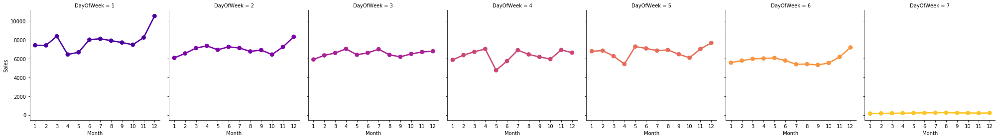

In [39]:
# 销售额均值-按星期几排序
sns.factorplot(data = train, x = 'Month', y = "Sales", 
               col = 'DayOfWeek', 
               palette = 'plasma',
               hue = 'DayOfWeek') 

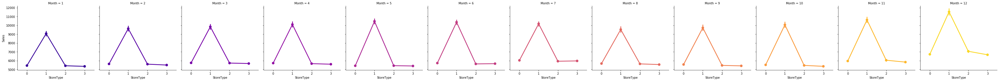

In [40]:
# 销售额-按月份
sns.factorplot(data = train, x = 'StoreType', y = "Sales", 
               col = 'Month', 
               palette = 'plasma',
               hue = 'Month') 

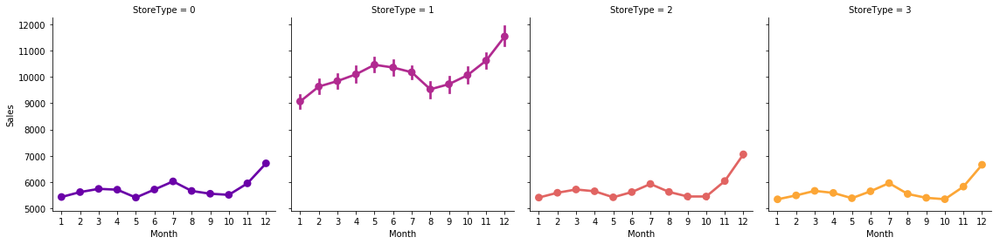

In [41]:
# 销售额-按店类型
sns.factorplot(data = train, x = 'Month', y = "Sales", 
               col = 'StoreType', 
               palette = 'plasma',
               hue = 'StoreType') 

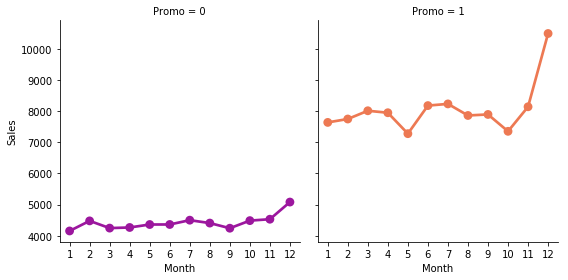

In [42]:
# 销售额均值-对比有无促销(Promo)
sns.factorplot(data = train, x = 'Month', y = "Sales", 
               col = 'Promo', 
               palette = 'plasma',
               hue = 'Promo',
               ) 

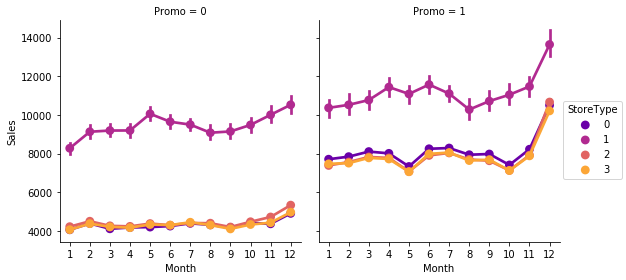

In [43]:
# 销售额均值-对比StoreType在促销的情况下
sns.factorplot(data = train, x = 'Month', y = "Sales", 
               col = 'Promo', 
               palette = 'plasma',
               hue = 'StoreType') 

# 排查异常数据

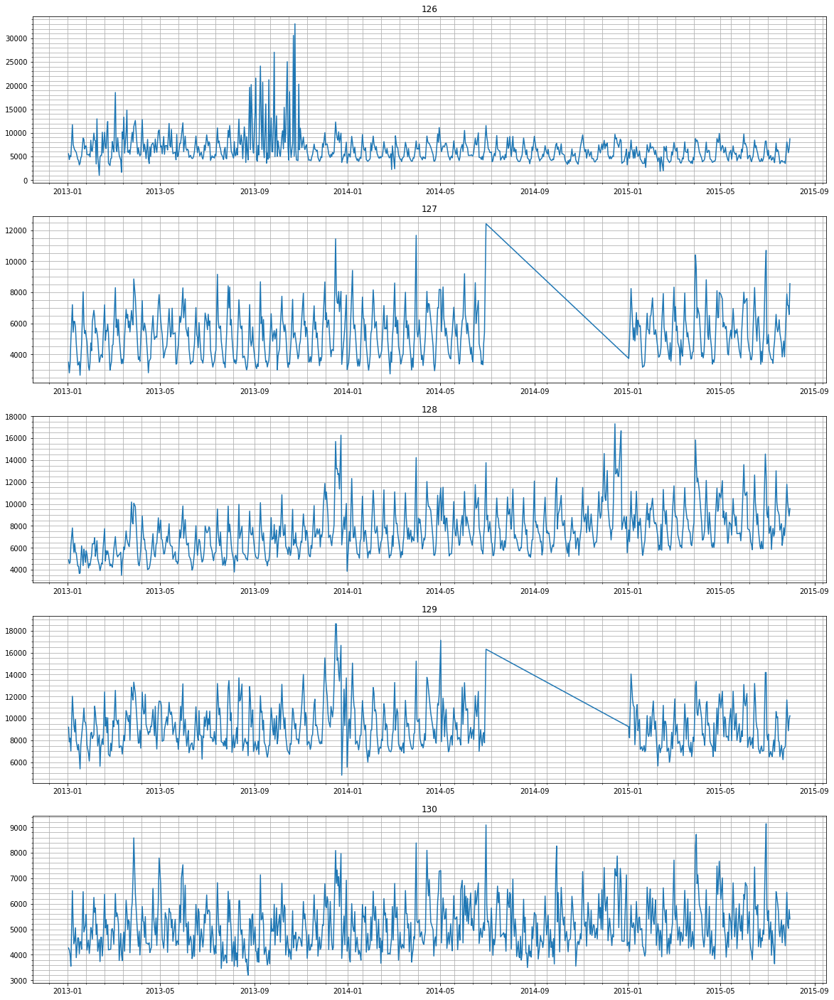

In [44]:
#手动排查异常数据
a=126
list_stores_to_check = range(a,a+5,1)
# 105,126,163,172,259,274,339,349,353,364,378,404,512,517,523,560,589,663,673,676,681,700,733,762,764,769,816,824,837,845,861,925,940,969,986
#991,1039,1068,1097,1115
plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    store = i

    # Normal sales
    X1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]
    y1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]['Sales']

    Xt = train.loc[(train['Store'] == store)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['Date'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

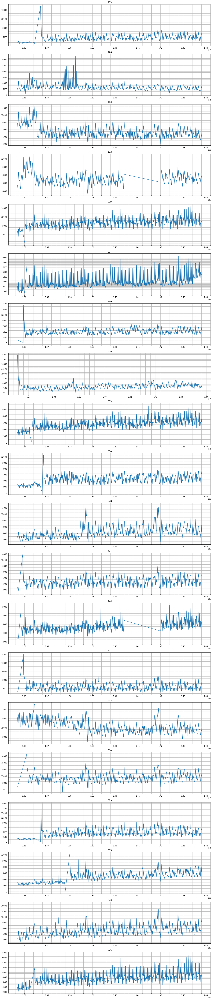

In [45]:
#手动排查异常数据
list_stores_to_check = [105,126,163,172,259,274,339,349,353,364,378,404,512,517,523,560,589,663,673,676]
# 105,126,163,172,259,274,339,349,353,364,378,404,512,517,523,560,589,663,673,676,681,700,733,762,764,769,816,824,837,845,861,925,940,969,986
#991,1039,1068,1097,1115
plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    store = i

    # Normal sales
    X1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]
    y1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]['Sales']

    Xt = train.loc[(train['Store'] == store)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateTS'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

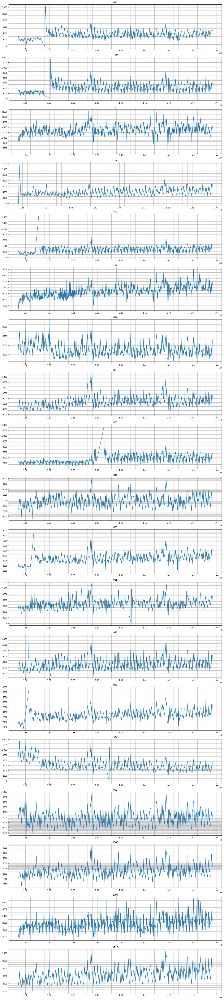

In [46]:
#手动排查异常数据
a=1100
list_stores_to_check = [681,700,733,762,764,769,816,824,837,845,861,925,940,969,986,991,1068,1097,1115]
# 105,126,163,172,259,274,339,349,353,364,378,404,512,517,523,560,589,663,673,676,681,700,733,762,764,769,816,824,837,845,861,925,940,969,986
#991,1039,1068,1097,1115
plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    store = i

    # Normal sales
    X1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]
    y1 = train.loc[(train['Store'] == store) & (train['Open'] == 1)]['Sales']

    Xt = train.loc[(train['Store'] == store)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateTS'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [47]:
store_dates_to_remove = {105:1.368e09,
                         126:1.384e09,
                         163:1.366e09,
                         172:1.366e09,
                         259:1.362e09,
                         274:1.362e09,
                         339:1.362e09,
                         349:1.368e09,
                         353:1.364e09,
                         364:1.37e09,
                         378:1.388e09,
                         404:1.36e09,
                         512:1.36e09,
                         517:1.362e09,
                         523:1.382e09,
                         560:1.362e09,
                         589:1.368e09,
                         663:1.382e09,
                         673:1.364e09,
                         676:1.366e09,
                         681:1.37e09,
                         700:1.372e09,
                         733:1.362e09,
                         762:1.36e09,
                         764:1.366e09,
                         769:1.362e09,
                         816:1.372e09,
                         824:1.378e09,
                         837:1.394e09,
                         845:1.364e09,
                         861:1.364e09,
                         925:1.362e09,
                         940:1.362e09,
                         969:1.362e09,
                         986:1.366e09,
                         991:1.362e09,
                         1068:1.36e09,
                         1097:1.36e09,
                         1115:1.364e09}

for key,value in store_dates_to_remove.iteritems():
    train.loc[(train['Store'] == key) & (train['DateTS'] < value), 'Train'] = 0

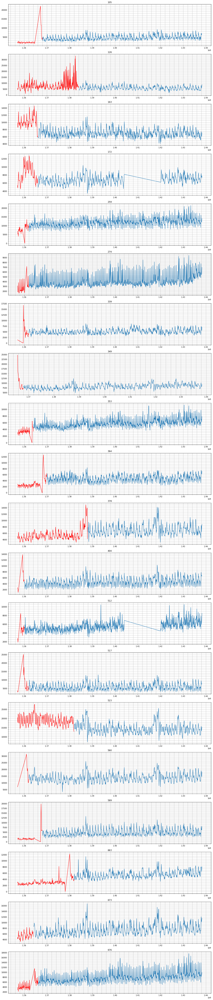

In [48]:
list_stores_to_check = [105,126,163,172,259,274,339,349,353,364,378,404,512,517,523,560,589,663,673,676]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 1)]
    y1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 1)]['Sales']
    
    X2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 0)]
    y2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 0)]['Sales']

    Xt = train.loc[(train['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateTS'], y1, '-')
    plt.plot(X2['DateTS'], y2, 'r')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

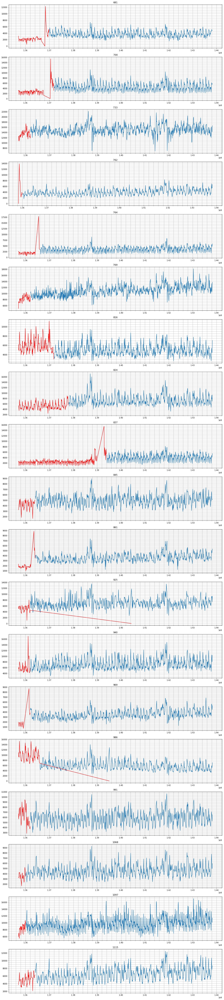

In [49]:
list_stores_to_check = [681,700,733,762,764,769,816,824,837,845,861,925,940,969,986,991,1068,1097,1115]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 1)]
    y1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 1)]['Sales']
    
    X2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 0)]
    y2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Train'] == 0)]['Sales']

    Xt = train.loc[(train['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateTS'], y1, '-')
    plt.plot(X2['DateTS'], y2, 'r')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [50]:
def check_outlier(points, t):
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > t

In [51]:
train.loc[(train['Store'] == 1) & (train['Train'] == 1)]


,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Train,...,Promo2TS,SalesPerDay,CustomersPerDay,SalesPerCustomersPerDay,Year,Month,Day,WeekOfYear,DateTS,IsPromoMonth
0,1,5,2015-07-31,5263.0,555.0,1,1,1,1,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,31,31,1.438272e+09,NaN
1,1,4,2015-07-30,5020.0,546.0,1,1,1,1,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,30,31,1.438186e+09,NaN
2,1,3,2015-07-29,4782.0,523.0,1,1,1,1,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,29,31,1.438099e+09,NaN
3,1,2,2015-07-28,5011.0,560.0,1,1,1,1,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,28,31,1.438013e+09,NaN
4,1,1,2015-07-27,6102.0,612.0,1,1,1,1,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,27,31,1.437926e+09,NaN
5,1,7,2015-07-26,0.0,0.0,0,0,1,0,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,26,30,1.437840e+09,NaN
6,1,6,2015-07-25,4364.0,500.0,1,0,1,0,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,25,30,1.437754e+09,NaN
7,1,5,2015-07-24,3706.0,459.0,1,0,1,0,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,24,30,1.437667e+09,NaN
8,1,4,2015-07-23,3769.0,503.0,1,0,1,0,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,23,30,1.437581e+09,NaN
9,1,3,2015-07-22,3464.0,463.0,1,0,1,0,1,...,NaN,3754.39798,444.972727,8.437366,2015,7,22,30,1.437494e+09,NaN


In [52]:
for i in train['Store'].unique():
    train.loc[(train['Store'] == i) & (train['Test'] == 0) & (train['Open'] == 1), 'Outlier'] = \
        check_outlier(train.loc[(train['Store'] == i) & (train['Test'] == 0)& (train['Open'] == 1)]['Sales'], 3.5)

In [53]:
train.loc[(train['Test'] == 0)&(train['Outlier']==True)].shape

(6425, 29)

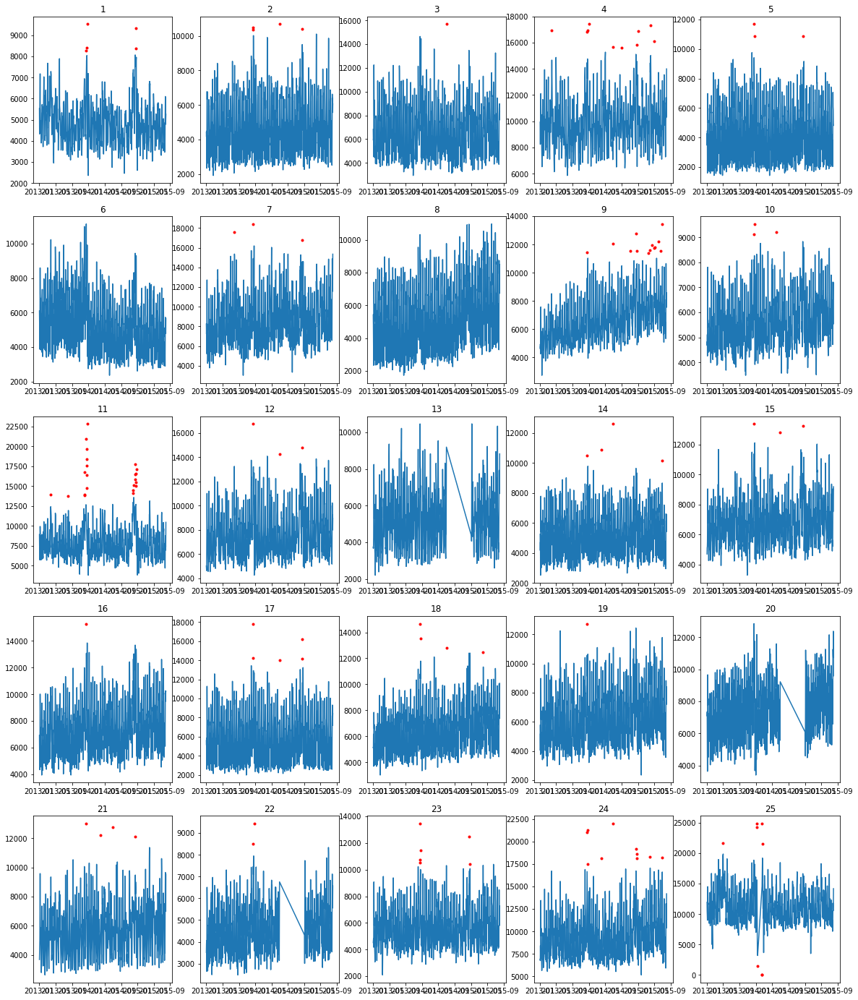

In [54]:
b = 1

plt.rcParams["figure.figsize"] = [20,10*5]

for i in range(b,b+25,1):
    stor = i

    # Normal sales
    X1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Outlier'] == False)]
    y1 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Outlier'] == False)]['Sales']

    # Outliers
    X2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Outlier'] == True)]
    y2 = train.loc[(train['Store'] == stor) & (train['Open'] == 1) & (train['Outlier'] == True)]['Sales']

    Xt = train.loc[(train['Store'] == stor)]
    
    plt.subplot(10,5,i)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(i)
    plt.axis('on')

In [55]:
def rmspe(preds,y):
    return np.sqrt(np.mean(((y - preds)/y) ** 2))

def rmspe_exp(preds,y):
    y = np.expm1(y.get_label())
    preds = np.expm1(preds)
    return "rmspe", rmspe(preds,y)

In [56]:
params = {"objective": "gpu:reg:linear",
          "booster" : "gbtree",
          "eta": 0.01,
          "max_depth": 12,
          "subsample": 0.7,
          "colsample_bytree": 0.5,
#           "min_child_weight": 1,
          "silent": 1,
          "seed": 42,
          'nthread':6,
#           "tree_method":"gpu_hist"
          }
num_boost_round = 20000

print("训练准备完成")
# X_train = train.loc[(train['Outlier'] == False) & (train['Delete'] != False) ]
# X_valid = valid.loc[(valid['Outlier'] == False) & (valid['Delete'] != False) ]
# y_train = np.log(X_train.Sales)
# y_valid = np.log(X_valid.Sales)
X_train, X_valid, y_train, y_valid = train_test_split(train.loc[(train['Train'] == 1) & (train['Open'] == 1) & (train['Outlier'] == False)][features],
                                                    np.log1p(train.loc[(train['Train'] == 1) & (train['Open'] == 1) & (train['Outlier'] == False)].Sales),
                                                    test_size=0.1)

dtrain = xgb.DMatrix(X_train[features], y_train)
dvalid = xgb.DMatrix(X_valid[features], y_valid)

evallist = [(dtrain, 'train'), (dvalid, 'eval')]
evals_results={}

训练准备完成


In [57]:
print features

['Store', 'Promo', 'SchoolHoliday', 'StateHoliday', 'StoreType', 'Assortment', 'Promo2', 'CompetitionDistance', 'CompetitionOpenTS', 'Promo2TS', 'SalesPerDay', 'CustomersPerDay', 'SalesPerCustomersPerDay', 'IsPromoMonth', 'DayOfWeek', 'Month', 'Day', 'Year', 'WeekOfYear', 'DateTS']


In [ ]:
gbm = xgb.train(params, dtrain, num_boost_round, evals=evallist,evals_result=evals_results, early_stopping_rounds=200, \
  feval=rmspe_exp, verbose_eval=50)

[0]	train-rmse:8.1818	eval-rmse:8.18132	train-rmspe:0.999864	eval-rmspe:0.999864
Multiple eval metrics have been passed: 'eval-rmspe' will be used for early stopping.

Will train until eval-rmspe hasn't improved in 200 rounds.
[50]	train-rmse:4.95458	eval-rmse:4.95445	train-rmspe:0.992651	eval-rmspe:0.992653
[100]	train-rmse:3.00248	eval-rmse:3.00258	train-rmspe:0.948332	eval-rmspe:0.948322
[150]	train-rmse:1.82249	eval-rmse:1.82281	train-rmspe:0.833833	eval-rmspe:0.833612
[200]	train-rmse:1.1102	eval-rmse:1.11064	train-rmspe:0.664566	eval-rmspe:0.663475
[250]	train-rmse:0.681877	eval-rmse:0.68247	train-rmspe:0.489824	eval-rmspe:0.486515
[300]	train-rmse:0.426283	eval-rmse:0.427171	train-rmspe:0.346983	eval-rmspe:0.340436
[350]	train-rmse:0.276508	eval-rmse:0.27795	train-rmspe:0.2492	eval-rmspe:0.238181
[400]	train-rmse:0.192277	eval-rmse:0.194548	train-rmspe:0.192058	eval-rmspe:0.176617
[450]	train-rmse:0.147276	eval-rmse:0.150502	train-rmspe:0.163279	eval-rmspe:0.144418
[500]	train-r

[4700]	train-rmse:0.059126	eval-rmse:0.083727	train-rmspe:0.061292	eval-rmspe:0.094716
[4750]	train-rmse:0.058935	eval-rmse:0.083689	train-rmspe:0.06108	eval-rmspe:0.094671
[4800]	train-rmse:0.058718	eval-rmse:0.083645	train-rmspe:0.060823	eval-rmspe:0.094635
[4850]	train-rmse:0.05851	eval-rmse:0.083605	train-rmspe:0.060561	eval-rmspe:0.0946
[4900]	train-rmse:0.058299	eval-rmse:0.083573	train-rmspe:0.060313	eval-rmspe:0.094583
[4950]	train-rmse:0.058111	eval-rmse:0.083542	train-rmspe:0.060081	eval-rmspe:0.09455
[5000]	train-rmse:0.057919	eval-rmse:0.083507	train-rmspe:0.05986	eval-rmspe:0.094514
[5050]	train-rmse:0.057735	eval-rmse:0.08348	train-rmspe:0.059647	eval-rmspe:0.094501
[5100]	train-rmse:0.057531	eval-rmse:0.083442	train-rmspe:0.059419	eval-rmspe:0.094465
[5150]	train-rmse:0.057358	eval-rmse:0.083414	train-rmspe:0.059223	eval-rmspe:0.094451
[5200]	train-rmse:0.057173	eval-rmse:0.083384	train-rmspe:0.058995	eval-rmspe:0.094427
[5250]	train-rmse:0.056975	eval-rmse:0.083349	trai

In [ ]:
import winsound 
winsound.Beep(400, 1000)

In [ ]:
plt.rcParams["figure.figsize"] = [10,5]
# 训练过程可视化
plt.plot(evals_results['train']['rmspe'][400:])
plt.plot(evals_results['eval']['rmspe'][400:])
plt.title('model accuracy')
plt.ylabel('rmspe_value')
plt.xlabel('num_boost_round')
plt.legend(['train', 'eval'], loc='upper left')
plt.savefig("model1.png")  

In [ ]:
print "生成测试集"
dtest = xgb.DMatrix(train.loc[(train['Test'] == 1)][features])
test_probs = gbm.predict(dtest)
result = pd.DataFrame({"Id": train.loc[(train['Test'] == 1)]['Id'].astype('int'), 'Sales': np.expm1(test_probs)*0.965})
result.to_csv("xgboost_submission10.csv", index=False)

In [ ]:
gbm.save_model('final.model')

In [ ]:
plt.rcParams["figure.figsize"] = [15,15]

In [ ]:
xgb.plot_importance(gbm,ax=None, height=0.2, xlim=None, ylim=None, title='Feature importance', xlabel='F score', ylabel='Features', importance_type='weight', max_num_features=None, grid=True, show_values=False)

In [ ]:
np.exp(np.log(5000))

In [ ]:
np.expm1(np.log1p(5000))